Authors:
Amir Eskanlou (eskanlou@stanford.edu);
 David Zhen Yin (yinzhen@stanford.edu)

---

This tutorial demonstrates multi-dimensional Gaussian Process Regression (GPR) with variogram-based spatial modeling in Python, applied to experimental mineral processing datasets. It is a supplementary workflow for the paper:

*The Use of Gaussian Process Regression in Modelling Computational and Experimental Mineral Processing Data*

**Learning Objectives:**

- Fit and interpret empirical variograms.

- Build GPR models that respect spatial correlations in multi-dimensional space.

- Generate conditional realizations to assess variability.

- Quantify prediction uncertainty.

- Visualize spatial fields.

**Case Study:**
We use a DoE-derived froth flotation dataset with:

- x1: particle size

- x2: particle circularity

- x3: bubble Reynolds number

- x4: micro-turbulence

- x5: bubble surface area flux

- y1: flotation rate constant

- y2: bubble-particle collision efficiency

Our goal is to use GPR to map the efficient frontier for y1 and y2 to optimize the flotation process.

### Install and Load Necessary Packages

In [1]:
! pip install gstools -qq
! pip install scikit-gstat  -qq
! pip install seaborn==0.13.2 -qq
# ------------------------------------------------------------------
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.interpolate import RegularGridInterpolator
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KernelDensity
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from tqdm.notebook import trange
import plotly.express as px
import skgstat as skg
import gstools as gs
import seaborn as sns
import pandas as pd
import numpy as np
# ------------------------------------------------------------------
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['xtick.labelsize'] = 12         # x-axis tick labels
plt.rcParams['ytick.labelsize'] = 12         # y-axis tick labels
plt.rcParams['axes.labelsize'] = 14          # x and y axis labels
plt.rcParams['axes.titlesize'] = 14          # axes title
plt.rcParams['legend.fontsize'] = 14         # legend font size
plt.rcParams['legend.title_fontsize'] = 14   # legend title font size
plt.rcParams['lines.linewidth'] = 2          # line width
plt.rcParams['grid.alpha'] = 0.3             # grid transparency
plt.rcParams['grid.linestyle'] = '--'        # dashed grid

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.2/166.2 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 708.6/708.6 kB 6.9 MB/s eta 0:00:00


### Load the Dataset

In [2]:
df = pd.read_csv('https://www.dropbox.com/scl/fi/e3o751xa08f52ev36rzq7/experimental.csv?rlkey=nhxh5cq6m5pm7486jbyus657i&st=rkg0yr1q&dl=1')

y1 = df['y1'].to_numpy()          # collision efficiency
y2 = df['y2'].to_numpy()          # kinetic constant
x1 = df['x1'].to_numpy()          # particle size
x2 = df['x2'].to_numpy()          # particle circularity
x3 = df['x3'].to_numpy()          # bubble Reynold's number
x4 = df['x4'].to_numpy()          # micro-turbulence
x5 = df['x5'].to_numpy()          # bubble surface flux

X = np.column_stack([x1, x2, x3, x4, x5])

Y = df[['y1','y2']].to_numpy()

In [3]:
# pairplot of input variables

# sns.pairplot(
#     df[['x1', 'x2', 'x3', 'x4', 'x5']], # 'y1', 'y2'
#     diag_kind='kde',
#     plot_kws={'color': 'blue', 'alpha': 0.6},
#     diag_kws={'color': 'blue', 'fill': True, 'alpha': 0.1})
# # plt.savefig("pairplot-mu-gap-energy.svg", format="svg", transparent=True)
# plt.tight_layout()
# plt.show()

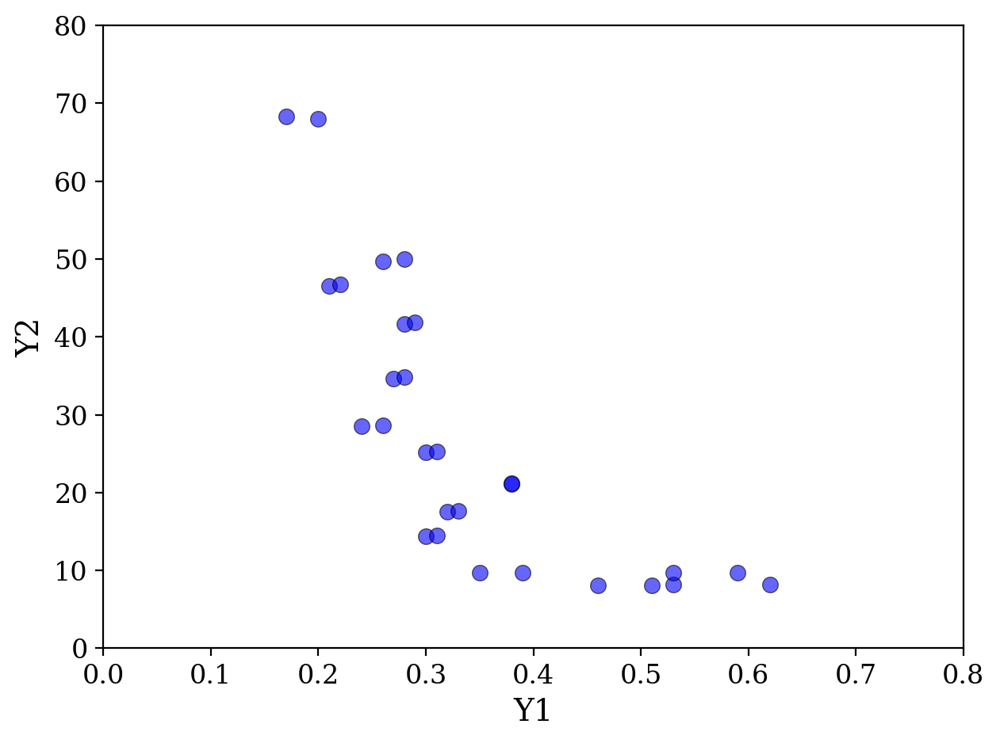

In [4]:
# scatter plot Y1 vs Y2

plt.scatter(Y[:,0], Y[:,1], s = 50, c='b', alpha = 0.6, edgecolors='k', linewidths=0.5)

plt.xlabel('Y1'); plt.ylabel('Y2')
plt.ylim(0, 80)
plt.xlim(0, 0.8)
plt.tight_layout()
plt.show()

## Principal Component Analysis

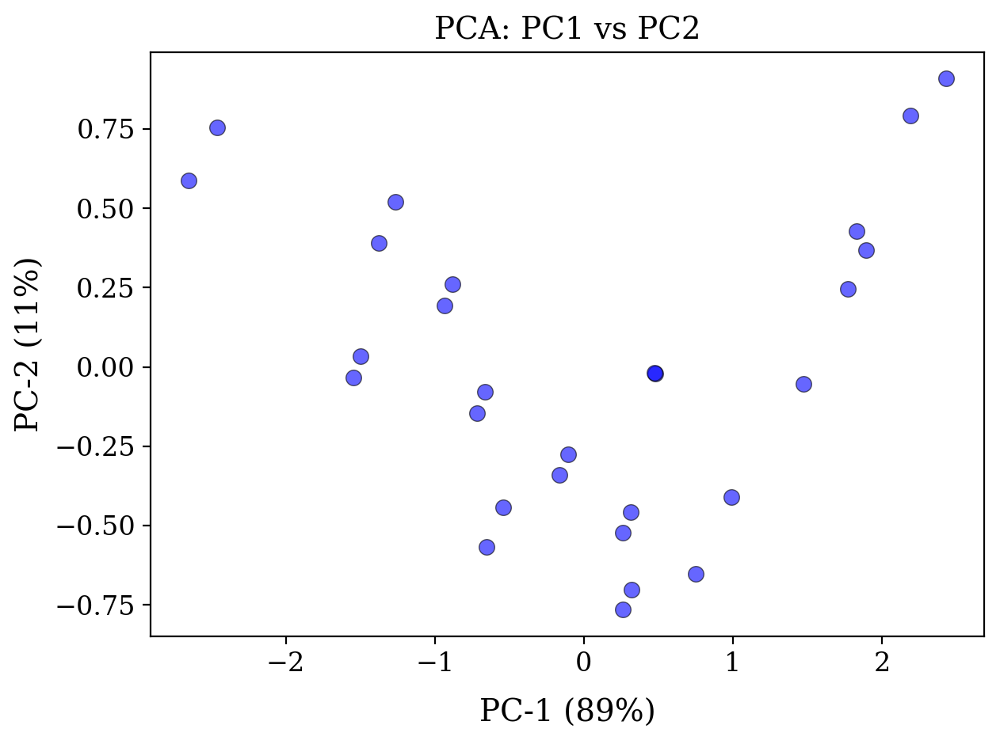

In [5]:
Y_stdrd = (Y - Y.mean(axis=0)) / Y.std(axis=0) # Standardize Y1 and Y2

Y_pca = PCA(n_components=2, svd_solver='full') # # Initialize PCA
Y_pca.fit(Y_stdrd)

PCs = Y_pca.transform(Y_stdrd) # Transform standardized data into principal component space

plt.scatter(PCs[:,0], PCs[:,1], s=50, c='b', alpha = 0.6, edgecolors='k', linewidths=0.5)  #
plt.xlabel(f'PC-1 ({Y_pca.explained_variance_ratio_[0]*100:.0f}%)', labelpad=10)
plt.ylabel(f'PC-2 ({Y_pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA: PC1 vs PC2')
# plt.colorbar(label='Ec(%)')
plt.tight_layout()
plt.show()

In [6]:
# save PCs to df

df['PC1'] = PCs[:, 0]
df['PC2'] = PCs[:, 1]

PC1 = df['PC1'].to_numpy()
PC2 = df['PC2'].to_numpy()

print(df.head())

  Mineral        x1        x2        x3        x4        x5    y1     y2  \
0  Pyrite  1.000000  0.056140  1.000000  1.000000  0.000000  0.21  46.54   
1  Pyrite  0.763593  0.631579  1.000000  1.000000  0.000000  0.24  28.51   
2  Pyrite  0.517730  0.617544  1.000000  1.000000  0.000000  0.30  14.41   
3  Pyrite  0.763593  0.631579  0.554433  0.662295  0.109756  0.27  34.64   
4  Pyrite  0.517730  0.617544  0.554433  0.662295  0.109756  0.32  17.52   

        PC1       PC2  
0 -1.547767 -0.034635  
1 -0.654447 -0.567733  
2  0.263525 -0.765262  
3 -0.716820 -0.145139  
4  0.260577 -0.522167  


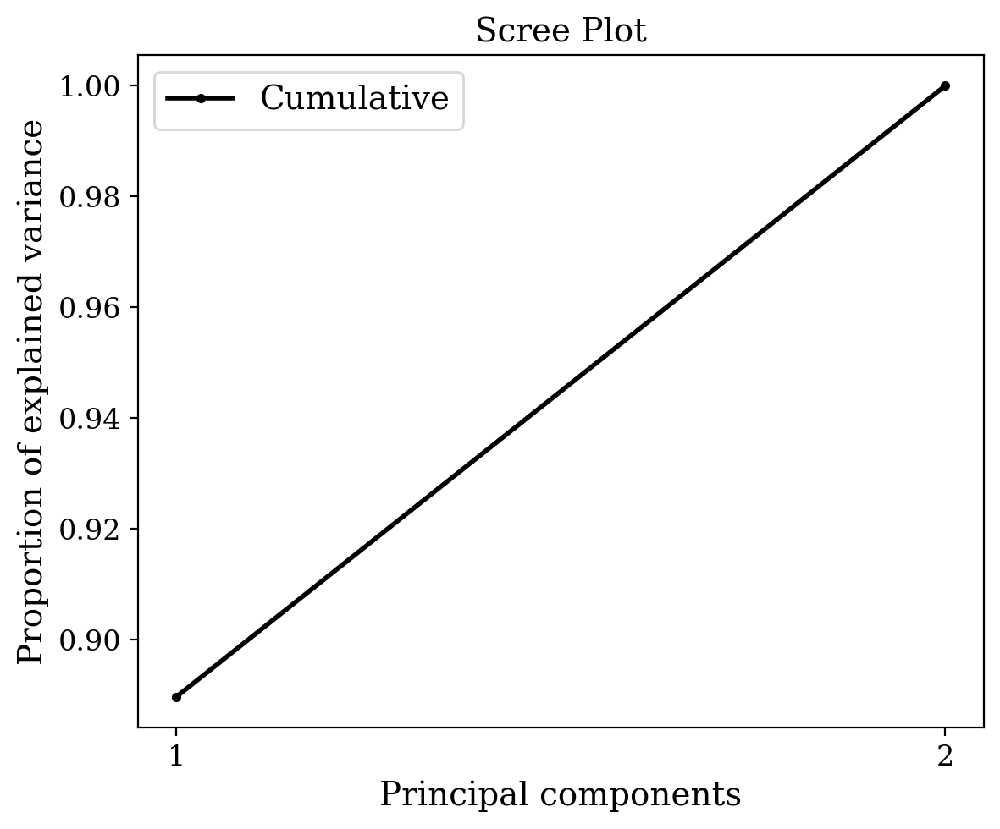

In [7]:
# scree plot

v = Y_pca.explained_variance_ratio_  # Get the proportion of variance explained by each PC

plt.figure(figsize=(6,5))
#plt.plot(np.arange(1, len(v)+1), v, '.-', color='b', label='Individual')
plt.plot(np.arange(1, len(v)+1), np.cumsum(v)/np.sum(v), '.-', color='k', label='Cumulative')
plt.xticks(np.arange(1, len(v) + 1))
plt.xlabel('Principal components', fontsize=14)
plt.ylabel('Proportion of explained variance', fontsize=14)
plt.title('Scree Plot', fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

## Variogram Modeling for 5Xs vs PC1 and PC2

In [8]:
# Create a Gaussian variogram model for the PC1 with manual fit parameters

skg.plotting.backend('plotly')

Vario = skg.Variogram(
    X, PC1, model='gaussian',
    maxlag=0.9, n_lags=9,
    fit_method='manual', fit_sill=2.0, fit_nugget=0.05, fit_range=1.6, normalize=False,) #

fig = Vario.plot(show=False)
fig.update_layout(
    title="Variogram PC-1",  #
    font=dict(family="Times New Roman", size=15, color="black"),
    width=800, height=450, margin=dict(l=60, r=30, t=30, b=60)
)
fig.show()

r, s, n = Vario.parameters
print('Variogram parameters:')
print(f"range  = {r:.3f}")
print(f"sill   = {s:.3f}")
print(f"nugget = {n:.3f}")

Variogram parameters:
range  = 1.600
sill   = 2.000
nugget = 0.000


In [9]:
# Create a Gaussian variogram model for the PC2 with manual fit parameters

skg.plotting.backend('plotly')

Vario = skg.Variogram(
    X, PC2, model='gaussian', maxlag=0.99, n_lags=8,
    fit_method='manual', fit_sill=0.25, fit_nugget=0.05, fit_range=1.5, normalize=False,) #

fig = Vario.plot(show=False)
fig.update_layout(
    title="Variogram PC-2",  #
    font=dict(family="Times New Roman", size=15, color="black"),
    width=800, height=450, margin=dict(l=60, r=30, t=30, b=60),
)
fig.show()

r, s, n = Vario.parameters
print('Variogram parameters:')
print(f"range  = {r:.3f}")
print(f"sill   = {s:.3f}")
print(f"nugget = {n:.3f}")

Variogram parameters:
range  = 1.500
sill   = 0.250
nugget = 0.000


## Ordinary Kriging (OK)

In [10]:
# Define a Gaussian variogram model for PC1 and PC2 with specified variance, length scale, and nugget

model_pc1 = gs.Gaussian(dim=X.shape[1], var=2.0, len_scale=1.5, nugget=0.05)
model_pc2 = gs.Gaussian(dim=X.shape[1], var=0.25, len_scale=1.0, nugget=0.01)

In [11]:
coords = []                      # Initialize a list to store coordinate arrays for each dimension in X
for i in range(X.shape[1]):      # Extract each column of X as a separate coordinate array and append to coords
    coords.append(X[:,i])

# Perform ordinary kriging for PC1 and PC2 using their variogram model and coordinates

o_krige_pc1 = gs.krige.Ordinary(model_pc1, coords, PC1, exact=True)
o_krige_pc2 = gs.krige.Ordinary(model_pc2, coords, PC2, exact=True)

## GPR using OK

In [12]:
# Define unstructured grid on X

def sample_between_bounds_near_X(X, n_samples=1000, bandwidth=0.1, seed=None):
    """
    Generate samples between X.min and X.max, with density concentrated near X.

    Parameters:
        X: [N, D] array
        n_samples: number of new samples to generate
        bandwidth: KDE bandwidth (controls spread)
        seed: random seed

    Returns:
        samples: [n_samples, D] array
    """
    if seed is not None:
        np.random.seed(seed)

    N, D = X.shape
    kde = KernelDensity(bandwidth=bandwidth, kernel='gaussian')
    kde.fit(X)

    # Rejection sampling: sample from bounding box, accept with KDE likelihood
    xmin, xmax = X.min(axis=0)-0.1, X.max(axis=0)+0.1
    samples = []

    oversample_factor = 3
    needed = n_samples

    while len(samples) < n_samples:
        candidates = np.random.uniform(low=xmin, high=xmax, size=(needed * oversample_factor, D))
        log_probs = kde.score_samples(candidates)

        # Normalize log_probs to get weights
        probs = np.exp(log_probs - np.max(log_probs))
        probs /= probs.sum()

        # Sample based on density
        selected_idx = np.random.choice(len(candidates), size=needed, replace=False, p=probs)
        selected = candidates[selected_idx]
        samples.extend(selected)

        needed = n_samples - len(samples)

    return np.r_[np.array(samples[:n_samples]),X]

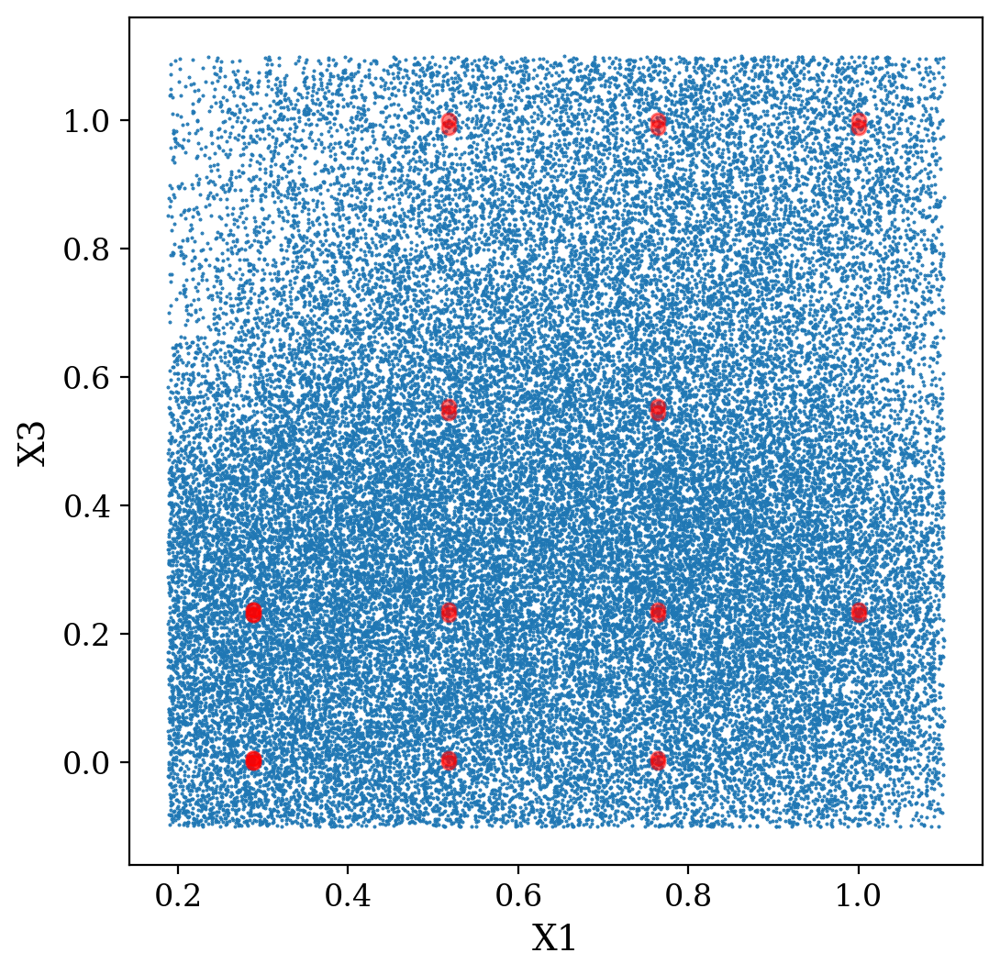

In [13]:
# Create unstructured sample points near existing data for interpolation
X_adaptive = sample_between_bounds_near_X(X, n_samples=50000, bandwidth=0.15)

plt.figure(figsize=(6, 6))
pltx_id, plty_id = 0,2       # Select indices for plotting on x- and y-axes (0 → X1, 2 → X3)

# Plot the unstructured grid points in light scatter form
plt.scatter(X_adaptive[:,pltx_id], X_adaptive[:,plty_id], s=0.2, label='Unstructured Grid')

# Plot the original data points in red for comparison
plt.scatter(X[:, pltx_id], X[:, plty_id], c='red', s=30, label='Data Points', alpha=0.5)
plt.xlabel('X1'); plt.ylabel('X3')
# plt.legend()
plt.show()

In [14]:
# Create conditional spatial random field (GPR) models for PC1 and PC2 based on ordinary kriging results
cond_srf_PC1 = gs.CondSRF(o_krige_pc1)
cond_srf_PC2 = gs.CondSRF(o_krige_pc2)

# Initialize a list to store interpolation coordinates
interpol_coords = [] # the interpolation coordinate

# Extract each dimension from X_adaptive and append to interpolation coordinates
for i in range(X.shape[1]):
    interpol_coords.append(X_adaptive[:,i])

# Set the interpolation positions for the conditional SRF models
cond_srf_PC1.set_pos(interpol_coords)
cond_srf_PC2.set_pos(interpol_coords)

In [15]:
# Simulation of PC1 values using the conditional spatial random field model
# Estimated run time: ~5 minutes

# Initialize a master random number generator with a fixed seed for reproducibility

seed = gs.random.MasterRNG(20170519)

# Define the number of realizations (ensemble size) for simulation
ens_no = 20 # number of realizations

# Run multiple conditional simulations and store each realization with a unique field name
for i in trange(ens_no):
    cond_srf_PC1(seed=seed(), store=[f"fld{i}", False, False])

  0%|          | 0/20 [00:00<?, ?it/s]

In [16]:
# Simulation of PC2
# Estimated run time: ~5 minutes

seed = gs.random.MasterRNG(20170519)
for i in trange(ens_no):
    cond_srf_PC2(seed=seed(), store=[f"fld{i}", False, False])

  0%|          | 0/20 [00:00<?, ?it/s]

In [17]:
# For PC1: Retrieve all stored simulation fields and store them in a list
fields_PC1 = [cond_srf_PC1[f"fld{i}"] for i in range(ens_no)]

# Stack all PC1 fields into a single 4D array: (ensemble_size, nx, ny, nz)
fields_PC1 = np.stack(fields_PC1, axis=0)  # shape: (ens_no, nx, ny, nz)

# For PC2: Retrieve all stored simulation fields and store them in a list
fields_PC2 = [cond_srf_PC2[f"fld{i}"] for i in range(ens_no)]

# Stack all PC2 fields into a single 4D array: (ensemble_size, nx, ny, nz)
fields_PC2 = np.stack(fields_PC2, axis=0)  # shape: (ens_no, nx, ny, nz)

# Compute the mean field for PC1 across all realizations (averaging over axis 0)
field_m_pc1 = fields_PC1.mean(axis=0)  # shape: (nx, ny, nz)

# Compute the mean field for PC2 across all realizations (averaging over axis 0)
field_m_pc2 = fields_PC2.mean(axis=0)  # shape: (nx, ny, nz)

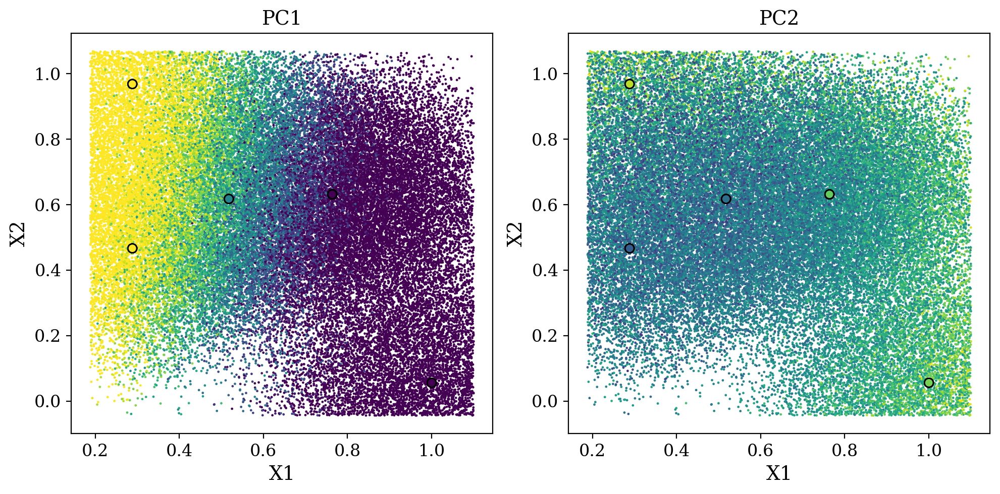

In [18]:
# Create a figure for side-by-side plots of PC1 and PC2
plt.figure(figsize=(10, 5))

# Plot for PC1
# Left subplot showing interpolation results and original data points for PC1
plt.subplot(121)
plt.scatter(interpol_coords[0], interpol_coords[1], s=0.5, c = fields_PC1[0], label='Unstructured Grid', vmax=1, vmin=-1)
plt.scatter(X[:, 0], X[:, 1], c=PC1, s=40, label='Data Points', edgecolor='k', vmax=1, vmin=-1)
plt.xlabel('X1'); plt.ylabel('X2')
plt.title('PC1')
# plt.legend()

# Plot for PC2
# Right subplot showing interpolation results and original data points for PC2
plt.subplot(122)
plt.scatter(interpol_coords[0], interpol_coords[1], s=0.5, c = fields_PC2[0], label='Unstructured Grid', vmax=1, vmin=-1)
plt.scatter(X[:, 0], X[:, 1], c=PC2, s=40, label='Data Points', edgecolor='k', vmax=1, vmin=-1)
plt.xlabel('X1'); plt.ylabel('X2')
plt.title('PC2')
# plt.legend()

# Adjust spacing between subplots and display the plots
plt.tight_layout()
plt.show()

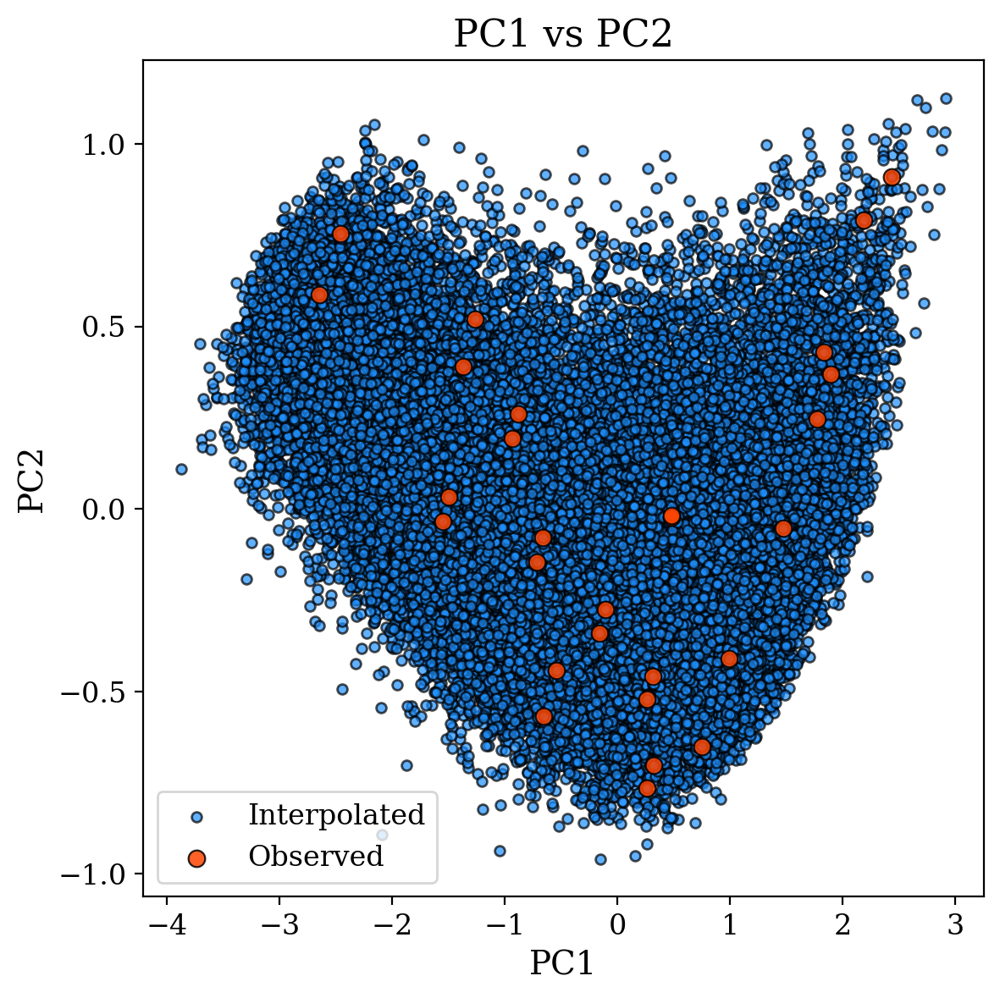

In [19]:
# Flatten the first realization of PC1 and PC2 fields for scatter plotting
pc1_flat = fields_PC1[0].flatten()
pc2_flat = fields_PC2[0].flatten()

# Create a figure for PC1 vs PC2 comparison
plt.figure(figsize=(6, 6))

# Plot interpolated PC values from the first realization
plt.scatter(pc1_flat, pc2_flat, c='dodgerblue', alpha=0.7, edgecolor='k', s=18, label='Interpolated')

# Overlay the original observed PC values from the dataset
plt.scatter(PC1, PC2, s=50, c='orangered', alpha=0.85, edgecolors='k', linewidths=0.8, label='Observed')

# Label axes with PC names
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC2', fontsize=14)

# Add a title to the plot
plt.title('PC1 vs PC2', fontsize=16)

# Display the legend and adjust layout for better spacing
plt.legend(fontsize=12, loc='best')
plt.tight_layout()

# Show the scatter plot
plt.show()

## Backtransform PCs to Ys

In [20]:
# Initialize a list to store back-transformed Y predictions for all realizations
back_transform_Y = []

# Loop through each realization in the ensemble
for i in trange(ens_no):
    # Stack kriged PC1 and PC2 for this realization into an array of shape (n_grid, 2)
    pc_gpr = np.c_[cond_srf_PC1[f"fld{i}"].flatten(), cond_srf_PC2[f"fld{i}"].flatten()]

    # Apply inverse PCA transformation to convert PCs back to standardized Y space
    Y_stdrd_pred = Y_pca.inverse_transform(pc_gpr)

    # Reverse the manual standardization to return to the original Y scale
    Y_orig_pred = (Y_stdrd_pred * Y.std(axis=0)) + Y.mean(axis=0)

    # Store the back-transformed Y predictions for this realization
    back_transform_Y.append(Y_orig_pred)

# Convert the list to a NumPy array with shape: (ens_no, n_grid, 2)
back_transform_Y = np.asarray(back_transform_Y)

  0%|          | 0/20 [00:00<?, ?it/s]

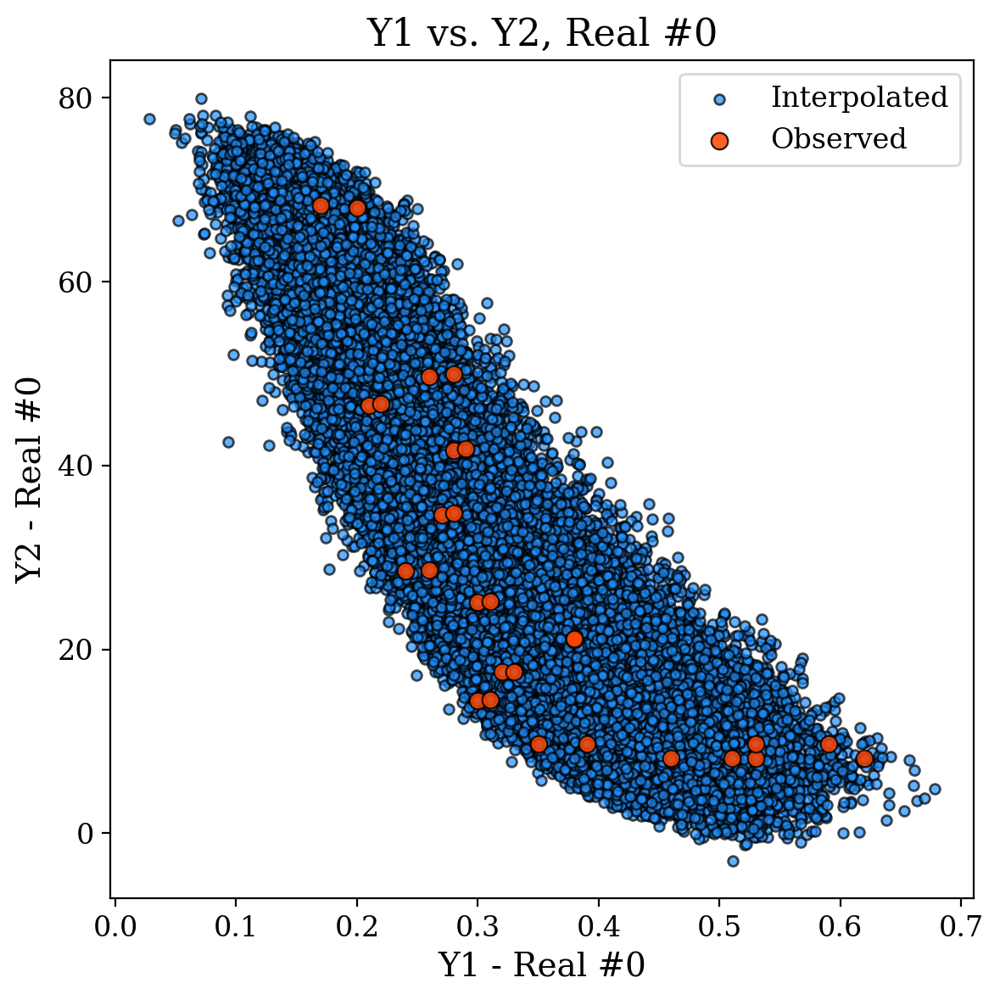

In [21]:
# Select which realization to plot
realnum = 0

# Extract the interpolated Y1 and Y2 values for the selected realization
Y1_interpol = back_transform_Y[realnum, :, 0]
Y2_interpol = back_transform_Y[realnum, :, 1]

# Create a figure for Y1 vs Y2 comparison
plt.figure(figsize=(6, 6))

# Plot interpolated Y values from the selected realization
plt.scatter(Y1_interpol, Y2_interpol, c='dodgerblue', alpha=0.7, edgecolor='k', s=18, label='Interpolated')

# Overlay the original observed Y values from the dataset
plt.scatter(Y[:, 0], Y[:, 1], s=50, c='orangered', alpha=0.85, edgecolors='k', linewidths=0.8, label='Observed')

# Label axes dynamically to include the realization number
plt.xlabel('Y1 - Real #' + str(realnum), fontsize=14)
plt.ylabel('Y2 - Real #' + str(realnum), fontsize=14)

# Add a descriptive title for the plot
plt.title('Y1 vs. Y2, Real #' + str(realnum), fontsize=16)

# Show legend and adjust layout for better spacing
plt.legend(fontsize=12, loc='best')
plt.tight_layout()

# Display the scatter plot
plt.show()

## Indentify efficent frontier

Now, we can identify the efficient frontier for y1 (Ec) and y2 (k) to optimize the flotation process. Each point along this frontier represents a Pareto-optimal trade-off, which can be mapped back to the predictor space, to determine the corresponding process settings.
In practice, we aim to maximize both y1 and k y2 for the desired mineral. Therefore, we can select an optimal trade-off point on the efficient frontier (green marker), and then obtain the corresponding process settings (red marker). This way, we will get the optimal values for each of the predictors corresponding to the optimal trade-off point.

In [22]:
def get_efficient_frontier(Y_input):
    """
    Returns the efficient frontier (Pareto front) from a 2D objective array Y.
    Assumes both objectives are to be maximized.

    Parameters:
        Y_input: (n_samples, 2) array of objective values

    Returns:
        frontier_points: (k, 2) array of Pareto-efficient points
        efficient_mask: boolean mask of shape (n_samples,) indicating Pareto-efficient points
        indices: indices of the Pareto-efficient points in the original array
    """

    # Number of points in the dataset
    n_points = Y_input.shape[0]

    # Initialize a mask assuming all points are efficient
    is_efficient = np.ones(n_points, dtype=bool)

    # Loop over all points to check Pareto dominance
    for i in range(n_points):
        if is_efficient[i]:
            # Mark points as efficient if no other point strictly dominates them
            is_efficient[is_efficient] = (
                np.any(Y_input[is_efficient] > Y_input[i], axis=1)
                | np.all(Y_input[is_efficient] == Y_input[i], axis=1)
            )
            # Ensure the current point i stays marked as efficient
            is_efficient[i] = True

    # Extract the Pareto frontier points
    frontier_points = Y_input[is_efficient]

    # Get the indices of efficient points
    indices = np.where(is_efficient)[0]

    return frontier_points, is_efficient, indices

In [23]:
# Combine interpolated Y1 and Y2 values into a single (n_samples, 2) array
Y1Y2 = np.c_[Y1_interpol, Y2_interpol]

# Compute the Pareto-efficient frontier for the interpolated data
frontier_points, efficient_mask, indices = get_efficient_frontier(Y1Y2)

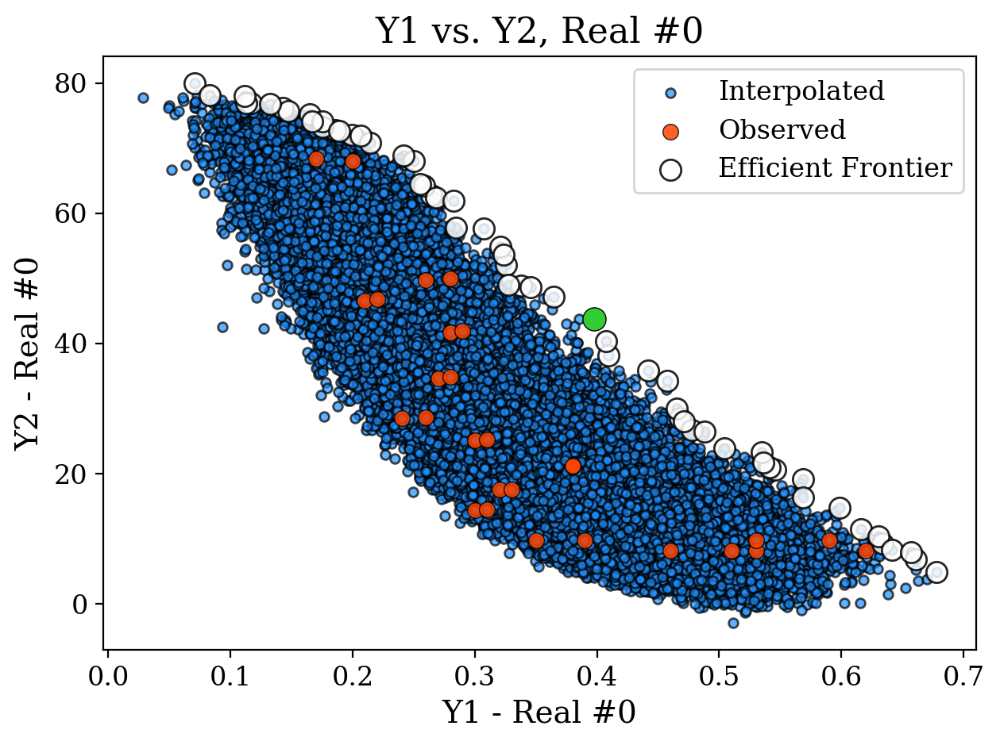

In [24]:
# select best trade-off point on the efficient frontier
y1 = frontier_points[:, 0]
y2 = frontier_points[:, 1]
eps = 1e-12
y1n = (y1 - y1.min()) / (y1.max() - y1.min() + eps)
y2n = (y2 - y2.min()) / (y2.max() - y2.min() + eps)
score = np.minimum(y1n, y2n)
cands = np.flatnonzero(np.isclose(score, score.max()))
best_idx = cands[np.argmax(y1n[cands] * y2n[cands])]
best_point = frontier_points[best_idx]

# Plot interpolated Y values from the selected realization
plt.scatter(Y1_interpol, Y2_interpol, c='dodgerblue', alpha=0.7, edgecolor='k', s=18, label='Interpolated')

# Overlay the original observed Y values from the dataset
plt.scatter(Y[:, 0], Y[:, 1], s=50, c='orangered', alpha=0.85, edgecolors='k', linewidths=0.5, label='Observed')

# Highlight the Pareto-efficient frontier points
plt.scatter(frontier_points[:, 0], frontier_points[:, 1], s=90, c='w', alpha=0.85, edgecolors='k', linewidths=1, label='Efficient Frontier')

# Highlight the best trade-off point in green
plt.scatter(best_point[0], best_point[1], s=110, c='limegreen', edgecolors='k', linewidths=0.5)

# Label axes dynamically to include the realization number
plt.xlabel('Y1 - Real #' + str(realnum), fontsize=14)
plt.ylabel('Y2 - Real #' + str(realnum), fontsize=14)

# Add a descriptive plot title
plt.title('Y1 vs. Y2, Real #' + str(realnum), fontsize=16)

# Display legend and adjust layout for better spacing
plt.legend(fontsize=12, loc='best')
plt.tight_layout()

# Show the plot
plt.show()

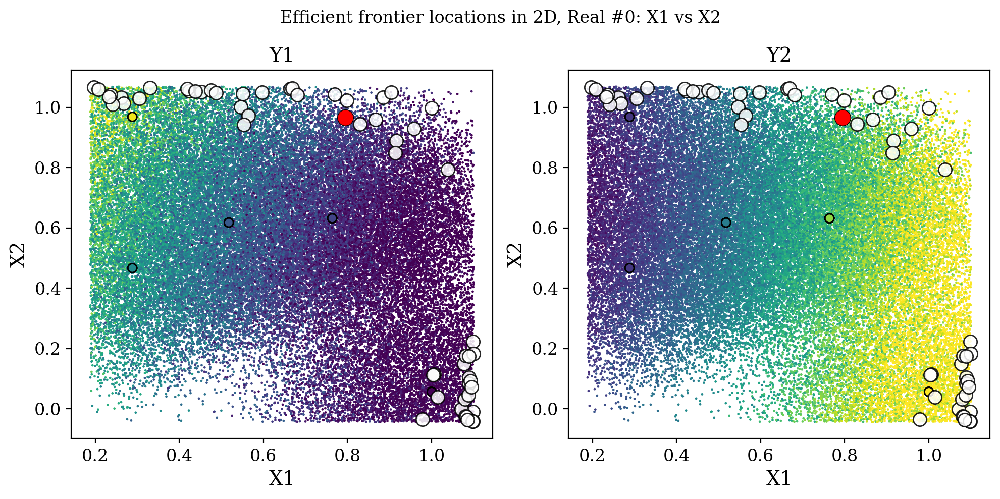

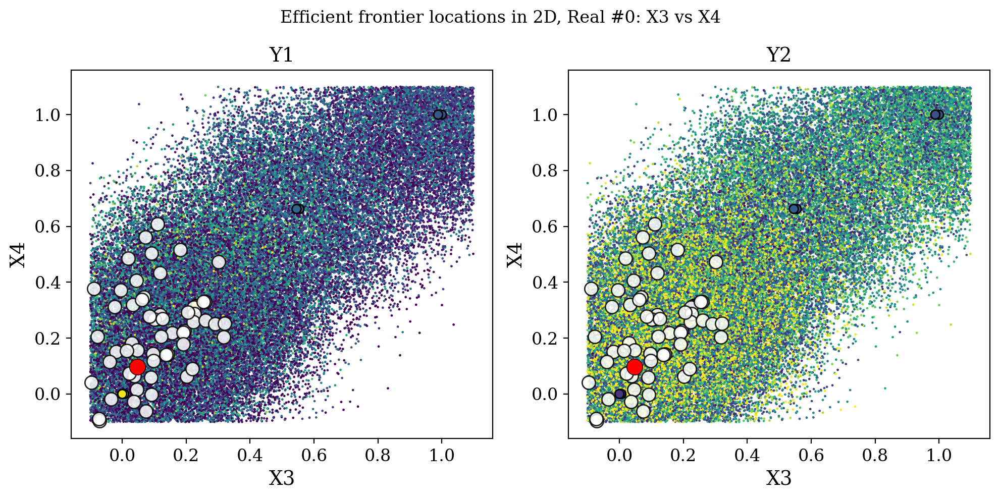

In [25]:
# Map chosen frontier point back to X, report values

# get the global interpolated-grid index and the X values at that point
best_global_idx = int(indices[best_idx])  # ensure plain int

# interpol_coords is a list of 1D arrays: one per predictor dimension
# build the vector of predictor values at the selected point
X_best = np.array([interpol_coords[d][best_global_idx] for d in range(len(interpol_coords))])

# plot the selected X location across 2D pairs
pairs = [(0,1), (2,3)] #(3,4), (0,3), (0,2), (1,3)]

# fix color scales so panels are comparable (adjust if desired)
Y1_vmin, Y1_vmax = 0.2, 0.6
Y2_vmin, Y2_vmax = 0.2, 60.0

for (ix, iy) in pairs:
    plt.figure(figsize=(10, 5))

    # LEFT: color by Y1
    plt.subplot(121)
    pltx_id, plty_id = ix, iy

    # Background: unstructured grid colored by interpolated Y1
    plt.scatter(interpol_coords[pltx_id], interpol_coords[plty_id],
                s=0.5, c=Y1_interpol, vmin=Y1_vmin, vmax=Y1_vmax, label='Unstructured Grid')

    # Observed data colored by observed Y1
    plt.scatter(X[:, pltx_id], X[:, plty_id],
                c=Y[:, 0], s=40, edgecolor='k', vmin=Y1_vmin, vmax=Y1_vmax, label='Data Points')

    # Efficient frontier projection in this 2D view
    plt.scatter(interpol_coords[pltx_id][indices],
                interpol_coords[plty_id][indices],
                s=90, c='w', alpha=0.85, edgecolors='k', linewidths=1, label='Efficient Frontier')

    # Highlight the SAME selected X in green
    plt.scatter(interpol_coords[pltx_id][best_global_idx],
                interpol_coords[plty_id][best_global_idx],
                s=130, c='red', edgecolors='k', linewidths=0.5)

    plt.xlabel(f'X{pltx_id + 1}'); plt.ylabel(f'X{plty_id + 1}')
    plt.title('Y1')

    # RIGHT: color by Y2
    plt.subplot(122)

    # Background: unstructured grid colored by interpolated Y2
    plt.scatter(interpol_coords[pltx_id], interpol_coords[plty_id],
                s=0.5, c=Y2_interpol, vmin=Y2_vmin, vmax=Y2_vmax, label='Unstructured Grid')

    # Observed data colored by observed Y2
    plt.scatter(X[:, pltx_id], X[:, plty_id],
                c=Y[:, 1], s=40, edgecolor='k', vmin=Y2_vmin, vmax=Y2_vmax, label='Data Points')

    # Efficient frontier projection in this 2D view
    plt.scatter(interpol_coords[pltx_id][indices],
                interpol_coords[plty_id][indices],
                s=90, c='w', alpha=0.85, edgecolors='k', linewidths=1, label='Efficient Frontier')

    # Highlight the SAME selected X in green
    plt.scatter(interpol_coords[pltx_id][best_global_idx],
                interpol_coords[plty_id][best_global_idx],
                s=130, c='red', edgecolors='k', linewidths=0.5,
                label='_nolegend_')

    plt.xlabel(f'X{pltx_id + 1}'); plt.ylabel(f'X{plty_id + 1}')
    plt.title('Y2')

    plt.suptitle(f'Efficient frontier locations in 2D, Real #{realnum}: X{ix+1} vs X{iy+1}')
    plt.tight_layout()
    plt.show()

In [26]:
# Print the corresponding optimal X1–X5.
# These predictors were min–max scaled to [0, 1] for modeling.
# For the case of your work, invert the scaling to recover original scale of each predictor for ease of interpretation
# x_orig = x_min + x_scaled * (x_max - x_min)
# (Use the same mins/maxes you used during scaling)

labels = [f"X{i}" for i in range(1, 6)]
vals = X_best[:5]

print(f"Optimum process settings (scaled values):")
for lbl, v in zip(labels, vals):
    print(f"  {lbl:<3} = {v:.4f}")

Optimum process settings (scaled values):
  X1  = 0.7944
  X2  = 0.9657
  X3  = 0.0479
  X4  = 0.0968
  X5  = 0.9960
